In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
os.chdir('/Users/Erin/git/accre_data_analysis/uniform_priors_.25his/')

In [3]:
traces = {}
for trace in ['d']:
    traces[trace] = [np.load('earm_mtdreamzs_12chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 12):
        traces[trace].append(np.load('earm_mtdreamzs_12chain_uniform_.25his_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [4]:
logps = {}
for trace in ['d']:
    logps[trace] = [np.load('earm_mtdreamzs_12chain_uniform_.25his_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 12):
        logps[trace].append(np.load('earm_mtdreamzs_12chain_uniform_.25his_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  d  chain: 0 =  [[         -inf]
 [         -inf]
 [         -inf]
 ..., 
 [ 135.46100641]
 [ 135.46100641]
 [ 135.46100641]]
Logp of trace:  d  chain:  1  =  [ 148.11368525]
Logp of trace:  d  chain:  2  =  [ 150.17529763]
Logp of trace:  d  chain:  3  =  [ 149.47037764]
Logp of trace:  d  chain:  4  =  [ 153.35561399]
Logp of trace:  d  chain:  5  =  [ 147.613156]
Logp of trace:  d  chain:  6  =  [ 148.35585706]
Logp of trace:  d  chain:  7  =  [ 149.5348985]
Logp of trace:  d  chain:  8  =  [ 144.95497425]
Logp of trace:  d  chain:  9  =  [ 148.67353605]
Logp of trace:  d  chain:  10  =  [ 149.25204909]
Logp of trace:  d  chain:  11  =  [ 149.72529167]


In [5]:
traces['d'][0][:,72]

array([-1.06990343, -1.06990343, -1.06990343, ...,  3.21310186,
        3.21310186,  3.21310186])

In [6]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['d']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [7]:
print_convergence_summary(param_trace_dicts['a'])

KeyError: 'a'

In [ ]:
print_convergence_summary(param_trace_dicts['b'])

In [ ]:
print_convergence_summary(param_trace_dicts['c'])

In [8]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  54  of  88  parameters.
Percent of parameters with GR below 1.2:  61.3636363636
Number of parameters with GR below 1.1:  20  of  88  parameters.
Percent of parameters with GR below 1.1:  22.7272727273


[54, 61.36363636363637, 20, 22.727272727272727]

50000
12
50000


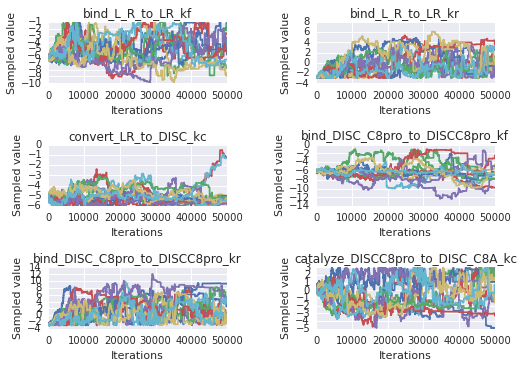

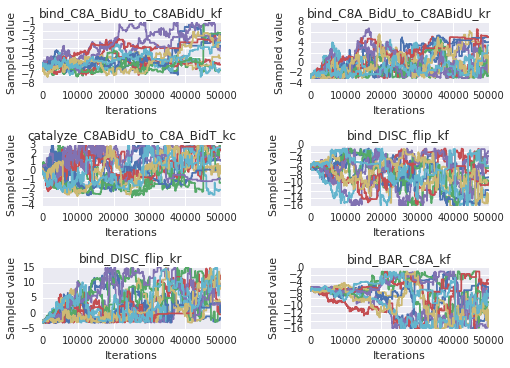

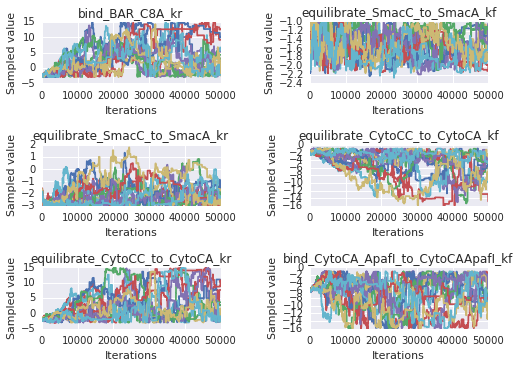

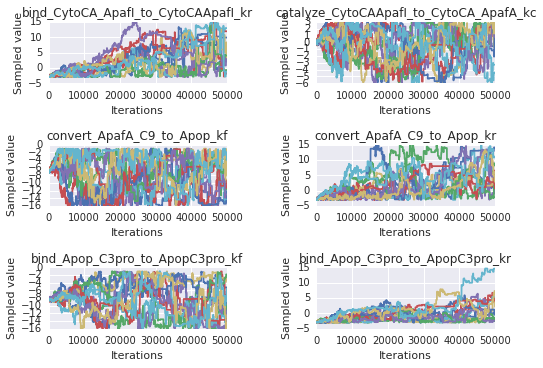

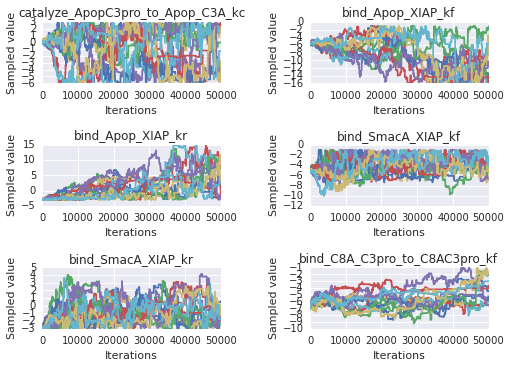

...

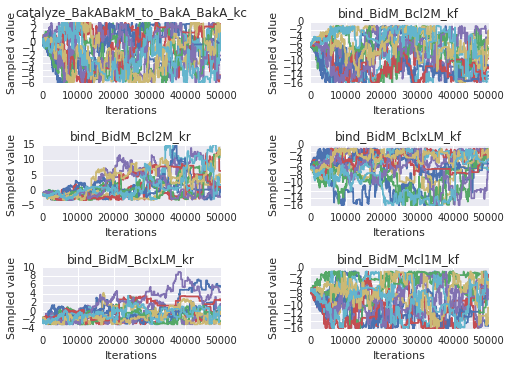

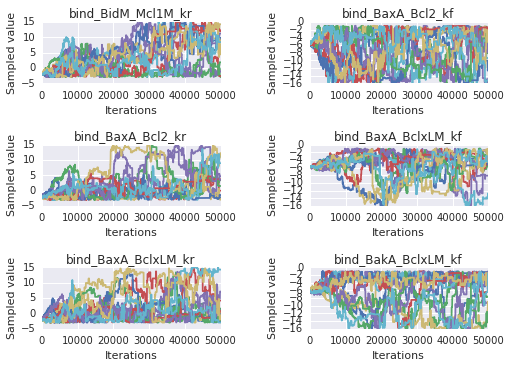

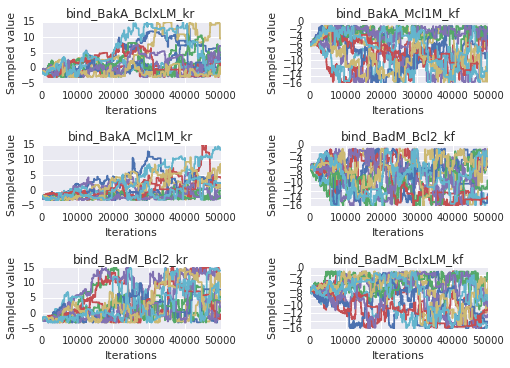

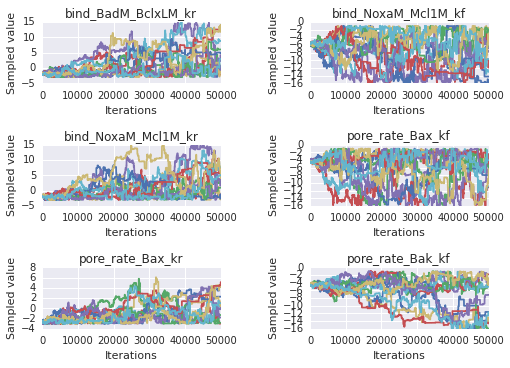

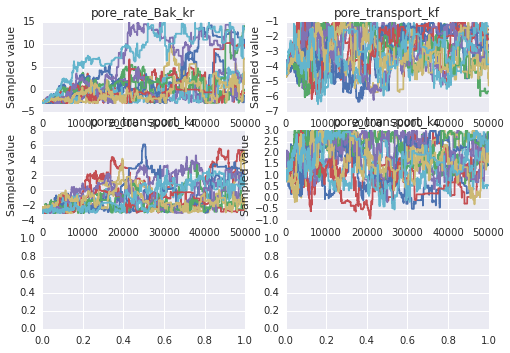

In [9]:
sample_plots(param_trace_dicts['d'])

In [10]:
#trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=40000, thin=1)
#trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=40000, thin=1)
#trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=40000, thin=1)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=20000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


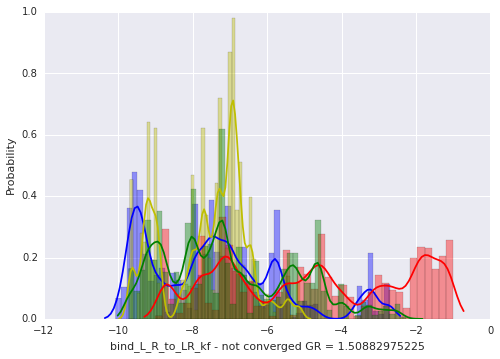

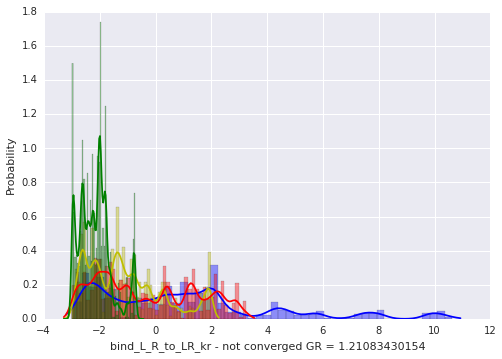

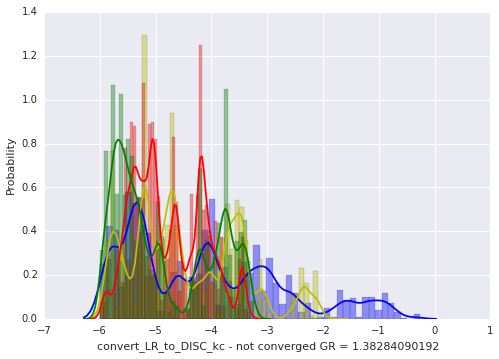

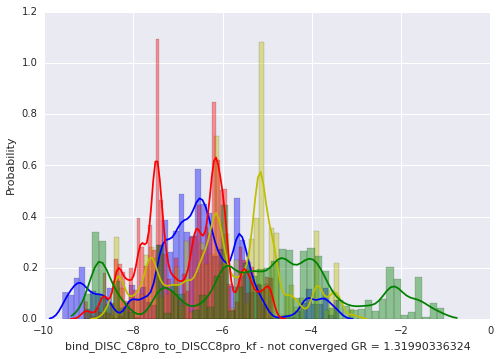

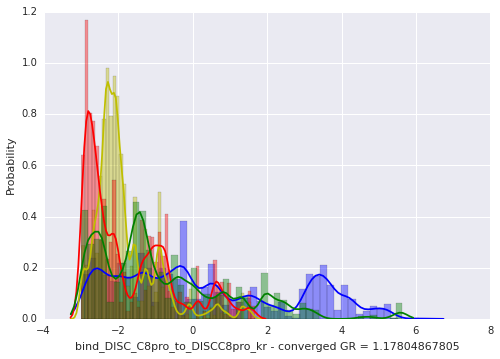

...

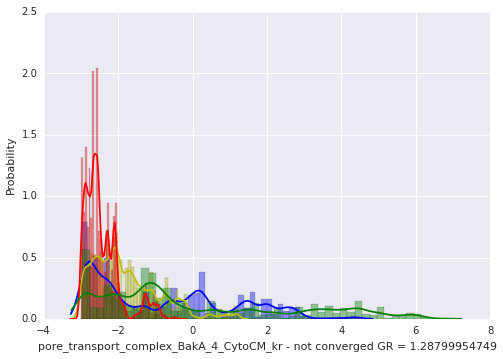

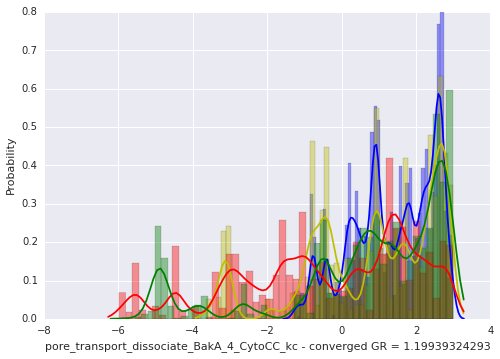

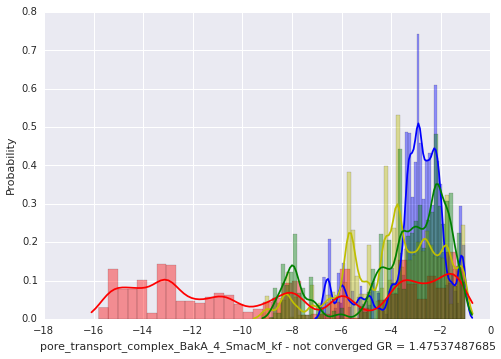

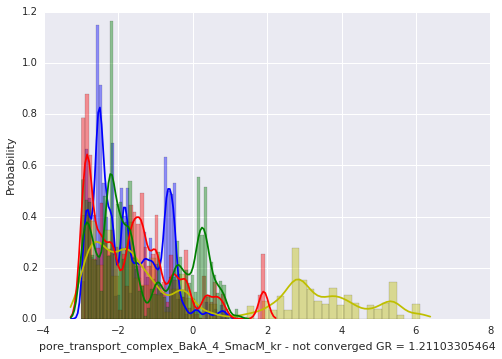

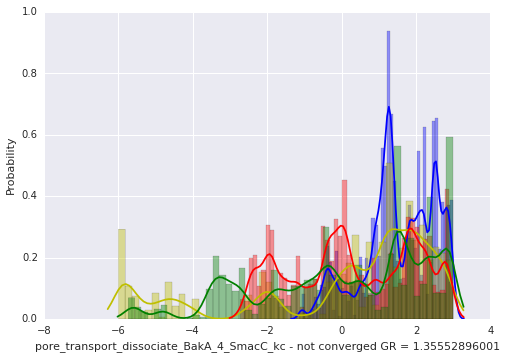

In [13]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    #ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    #sns.distplot(trace_arr_b[:,dim], hist=True, color='y')
    #sns.distplot(trace_arr_c[:,dim], hist=True, color='r')
    sns.distplot(trace_arr_d[:,dim], hist=True, color='g')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [14]:
traces['a'][1][:,0]

array([-6.35903831, -6.35903831, -6.35903831, ..., -6.22848983,
       -6.22848983, -6.22848983])

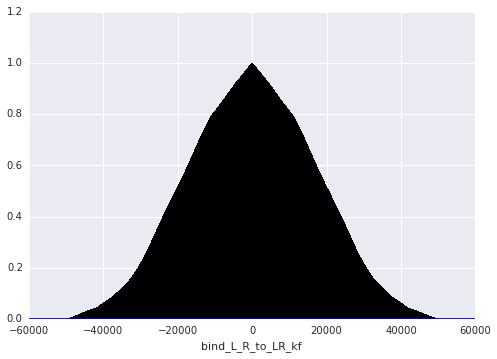

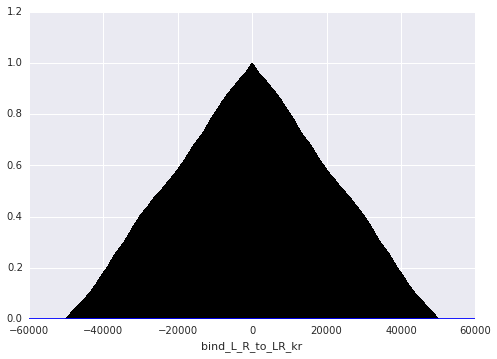

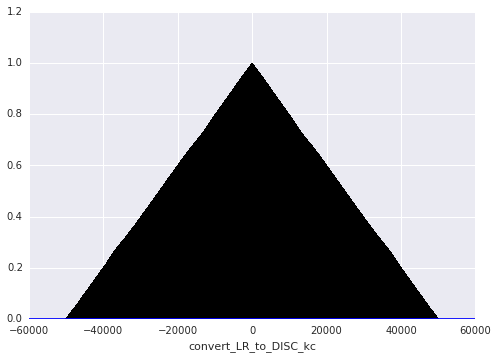

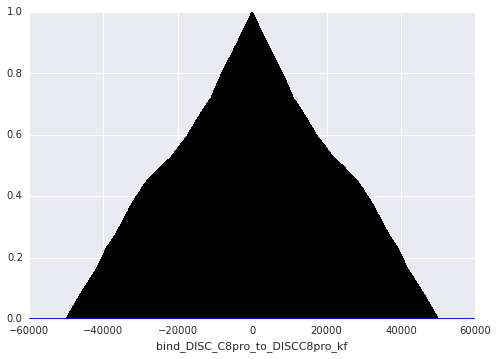

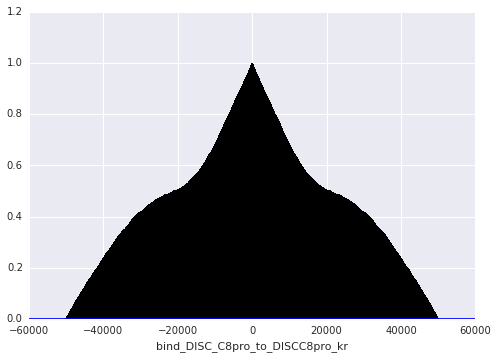

...

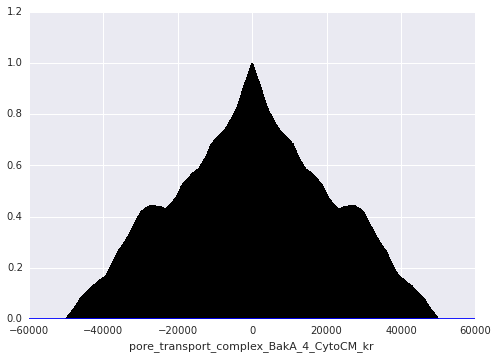

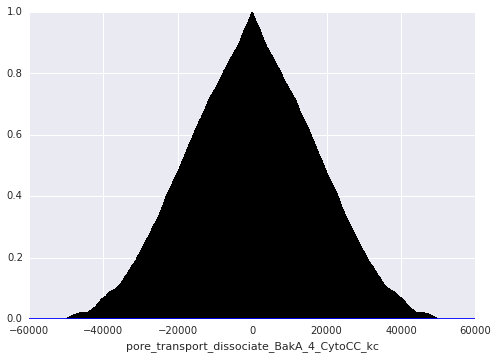

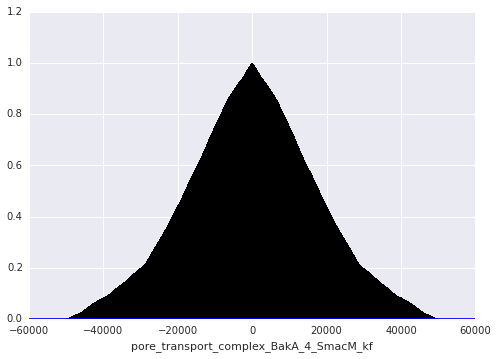

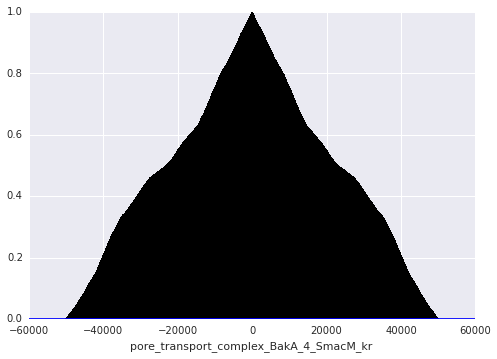

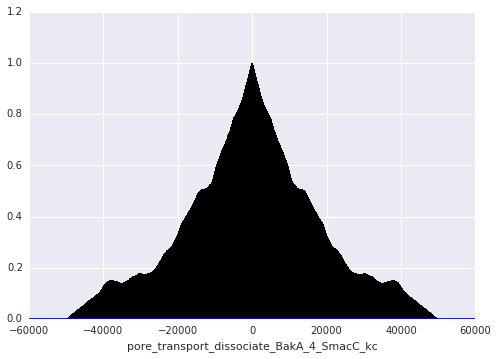

In [ ]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [13]:
acceptance_rates = np.zeros((len(traces['d'][0][0],)))
for dim in range(len(traces['d'][0][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['d'][0])):
        if traces['d'][0][iteration][dim] != traces['d'][0][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['d'][0])
    print 'N acceptances for parameter: ',str(param_trace_dicts['d']['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

 N acceptances for parameter:  bind_L_R_to_LR_kf  =  1224  acceptance rate:  0.02448
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1245  acceptance rate:  0.0249
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1162  acceptance rate:  0.02324
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1206  acceptance rate:  0.02412
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1233  acceptance rate:  0.02466
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1147  acceptance rate:  0.02294
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  1148  acceptance rate:  0.02296
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1267  acceptance rate:  0.02534
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1166  acceptance rate:  0.02332
N acceptances for parameter:  bind_DISC_flip_kf  =  1190  acceptance rate:  0.0238
N acceptances for parameter:  bind_DISC_flip_kr  =  1216  acceptance rate:  0.0

array([ 0.02448,  0.0249 ,  0.02324,  0.02412,  0.02466,  0.02294,
        0.02296,  0.02534,  0.02332,  0.0238 ,  0.02432,  0.02442,
        0.02504,  0.02418,  0.02486,  0.0246 ,  0.02516,  0.02526,
        0.02458,  0.02496,  0.02482,  0.02468,  0.02526,  0.02444,
        0.02528,  0.02532,  0.02484,  0.02468,  0.02484,  0.0222 ,
        0.02512,  0.0248 ,  0.0232 ,  0.02454,  0.02474,  0.02394,
        0.02438,  0.02402,  0.02294,  0.0248 ,  0.025  ,  0.02358,
        0.02546,  0.0235 ,  0.02486,  0.02512,  0.02426,  0.02522,
        0.02482,  0.02392,  0.02454,  0.02474,  0.02494,  0.02496,
        0.02478,  0.0248 ,  0.0251 ,  0.02564,  0.02454,  0.0242 ,
        0.02516,  0.02476,  0.025  ,  0.02556,  0.02524,  0.02574,
        0.0247 ,  0.02428,  0.0245 ,  0.02536,  0.02472,  0.0247 ,
        0.02468,  0.02474,  0.02438,  0.02468,  0.02456,  0.02478,
        0.02456,  0.02458,  0.0249 ,  0.02458,  0.02444,  0.02452,
        0.025  ,  0.02446,  0.02482,  0.02486])

In [15]:
acceptance_rates = np.zeros((len(traces['d'][1][0],)))
for dim in range(len(traces['d'][1][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['d'][0])):
        if traces['d'][1][iteration][dim] != traces['d'][1][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['d'][1])
    print 'N acceptances for parameter: ',str(param_trace_dicts['d']['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1262  acceptance rate:  0.02524
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1302  acceptance rate:  0.02604
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1204  acceptance rate:  0.02408
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1288  acceptance rate:  0.02576
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1288  acceptance rate:  0.02576
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1202  acceptance rate:  0.02404
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  1230  acceptance rate:  0.0246
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1331  acceptance rate:  0.02662
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1267  acceptance rate:  0.02534
N acceptances for parameter:  bind_DISC_flip_kf  =  1316  acceptance rate:  0.02632
N acceptances for parameter:  bind_DISC_flip_kr  =  1322  acceptance rate:  0.0

array([ 0.02524,  0.02604,  0.02408,  0.02576,  0.02576,  0.02404,
        0.0246 ,  0.02662,  0.02534,  0.02632,  0.02644,  0.02524,
        0.02586,  0.02622,  0.02612,  0.02596,  0.02662,  0.02662,
        0.0261 ,  0.02662,  0.02582,  0.02584,  0.02576,  0.0265 ,
        0.0262 ,  0.02626,  0.0262 ,  0.02622,  0.02682,  0.02296,
        0.02624,  0.02596,  0.025  ,  0.02642,  0.02652,  0.02496,
        0.0265 ,  0.02594,  0.02446,  0.02604,  0.02608,  0.02434,
        0.02614,  0.0254 ,  0.02622,  0.0262 ,  0.02576,  0.0261 ,
        0.02628,  0.02692,  0.02634,  0.02628,  0.02562,  0.02592,
        0.02568,  0.0261 ,  0.02686,  0.02664,  0.02572,  0.02622,
        0.0262 ,  0.02562,  0.0264 ,  0.02626,  0.0265 ,  0.02494,
        0.02638,  0.02664,  0.026  ,  0.02714,  0.02606,  0.02604,
        0.02584,  0.0256 ,  0.02652,  0.02604,  0.02692,  0.0261 ,
        0.02658,  0.02616,  0.02656,  0.02654,  0.0266 ,  0.02648,
        0.02604,  0.02544,  0.02664,  0.026  ])

In [19]:
acceptance_rates = np.zeros((len(traces['d'][2][0],)))
running_acceptance_rates = np.zeros((len(traces['d'][2][0]), len(traces['d'][2])))
for dim in range(len(traces['d'][2][0])):
    n_acceptances = 0
    
    for iteration in range(1, len(traces['d'][2])):
        if traces['d'][2][iteration][dim] != traces['d'][2][iteration-1][dim]:
            n_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
    acceptance_rates[dim] = float(n_acceptances)/len(traces['d'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
running_acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  1357  acceptance rate:  0.02714
N acceptances for parameter:  bind_L_R_to_LR_kr  =  1344  acceptance rate:  0.02688
N acceptances for parameter:  convert_LR_to_DISC_kc  =  1313  acceptance rate:  0.02626
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  1287  acceptance rate:  0.02574
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  1374  acceptance rate:  0.02748
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  1323  acceptance rate:  0.02646
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  1281  acceptance rate:  0.02562
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  1390  acceptance rate:  0.0278
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  1375  acceptance rate:  0.0275
N acceptances for parameter:  bind_DISC_flip_kf  =  1324  acceptance rate:  0.02648
N acceptances for parameter:  bind_DISC_flip_kr  =  1399  acceptance rate:  0.02

array([[ 0.        ,  0.        ,  0.        , ...,  0.02714163,
         0.02714109,  0.02714054],
       [ 0.        ,  0.        ,  0.        , ...,  0.02688161,
         0.02688108,  0.02688054],
       [ 0.        ,  0.        ,  0.        , ...,  0.02626158,
         0.02626105,  0.02626053],
       ..., 
       [ 0.        ,  0.        ,  0.        , ...,  0.02732164,
         0.02732109,  0.02732055],
       [ 0.        ,  0.        ,  0.        , ...,  0.02762166,
         0.0276211 ,  0.02762055],
       [ 0.        ,  0.        ,  0.        , ...,  0.02704162,
         0.02704108,  0.02704054]])

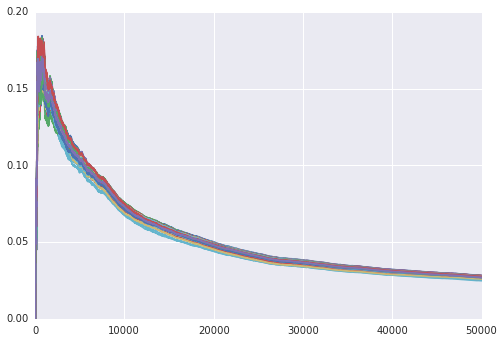

In [33]:
for dim in range(88):
    plt.plot(range(50000), running_acceptance_rates[dim,:])

In [18]:
acceptance_rates = np.zeros((len(traces['b'][3][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['b'][0])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  660  acceptance rate:  0.0132
N acceptances for parameter:  bind_L_R_to_LR_kr  =  673  acceptance rate:  0.01346
N acceptances for parameter:  convert_LR_to_DISC_kc  =  640  acceptance rate:  0.0128
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  637  acceptance rate:  0.01274
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  670  acceptance rate:  0.0134
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  670  acceptance rate:  0.0134
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  630  acceptance rate:  0.0126
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  672  acceptance rate:  0.01344
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  644  acceptance rate:  0.01288
N acceptances for parameter:  bind_DISC_flip_kf  =  658  acceptance rate:  0.01316
N acceptances for parameter:  bind_DISC_flip_kr  =  651  acceptance rate:  0.01302
N acceptan

array([ 0.0132 ,  0.01346,  0.0128 ,  0.01274,  0.0134 ,  0.0134 ,
        0.0126 ,  0.01344,  0.01288,  0.01316,  0.01302,  0.01308,
        0.01296,  0.0134 ,  0.01318,  0.01332,  0.01302,  0.01312,
        0.0132 ,  0.0134 ,  0.01296,  0.01388,  0.01316,  0.0135 ,
        0.01288,  0.01332,  0.01312,  0.0133 ,  0.01342,  0.01278,
        0.01334,  0.01322,  0.01246,  0.01312,  0.01328,  0.0131 ,
        0.01302,  0.01328,  0.0129 ,  0.01286,  0.01314,  0.01308,
        0.01334,  0.01328,  0.01336,  0.01346,  0.01278,  0.01306,
        0.01296,  0.01308,  0.0134 ,  0.01288,  0.01352,  0.01356,
        0.01346,  0.01334,  0.01316,  0.01322,  0.01326,  0.0133 ,
        0.01316,  0.01328,  0.01366,  0.0133 ,  0.01316,  0.0134 ,
        0.01336,  0.01306,  0.01334,  0.01316,  0.01346,  0.01308,
        0.01308,  0.01322,  0.01362,  0.0135 ,  0.0131 ,  0.01336,
        0.01348,  0.0133 ,  0.01312,  0.0134 ,  0.01328,  0.01298,
        0.01296,  0.0135 ,  0.01324,  0.01314,  0.01348,  0.01

In [19]:
acceptance_rates = np.zeros((len(traces['b'][4][0],)))
for dim in range(len(traces['a'][2][0])):
    n_acceptances = 0
    for iteration in range(1, len(traces['b'][0])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
acceptance_rates

N acceptances for parameter:  bind_L_R_to_LR_kf  =  660  acceptance rate:  0.0132
N acceptances for parameter:  bind_L_R_to_LR_kr  =  673  acceptance rate:  0.01346
N acceptances for parameter:  convert_LR_to_DISC_kc  =  640  acceptance rate:  0.0128
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  637  acceptance rate:  0.01274
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  670  acceptance rate:  0.0134
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  670  acceptance rate:  0.0134
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  630  acceptance rate:  0.0126
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  672  acceptance rate:  0.01344
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  644  acceptance rate:  0.01288
N acceptances for parameter:  bind_DISC_flip_kf  =  658  acceptance rate:  0.01316
N acceptances for parameter:  bind_DISC_flip_kr  =  651  acceptance rate:  0.01302
N acceptan

array([ 0.0132 ,  0.01346,  0.0128 ,  0.01274,  0.0134 ,  0.0134 ,
        0.0126 ,  0.01344,  0.01288,  0.01316,  0.01302,  0.01308,
        0.01296,  0.0134 ,  0.01318,  0.01332,  0.01302,  0.01312,
        0.0132 ,  0.0134 ,  0.01296,  0.01388,  0.01316,  0.0135 ,
        0.01288,  0.01332,  0.01312,  0.0133 ,  0.01342,  0.01278,
        0.01334,  0.01322,  0.01246,  0.01312,  0.01328,  0.0131 ,
        0.01302,  0.01328,  0.0129 ,  0.01286,  0.01314,  0.01308,
        0.01334,  0.01328,  0.01336,  0.01346,  0.01278,  0.01306,
        0.01296,  0.01308,  0.0134 ,  0.01288,  0.01352,  0.01356,
        0.01346,  0.01334,  0.01316,  0.01322,  0.01326,  0.0133 ,
        0.01316,  0.01328,  0.01366,  0.0133 ,  0.01316,  0.0134 ,
        0.01336,  0.01306,  0.01334,  0.01316,  0.01346,  0.01308,
        0.01308,  0.01322,  0.01362,  0.0135 ,  0.0131 ,  0.01336,
        0.01348,  0.0133 ,  0.01312,  0.0134 ,  0.01328,  0.01298,
        0.01296,  0.0135 ,  0.01324,  0.01314,  0.01348,  0.01